# UP 221 Final Project
## Group members: Purva Kapshikar, Hamzah Yaacob, and Jackson Zeng

## Research question
Which bus line among the AC Transit 19, 20, and 51A would benefit most from real-time information displays at some of their bus stops?

## Background

Real-time information displays inform transit riders about when the next bus is arriving at their stop. These displays provide convenience for all transit riders, but they are especially useful for those who lack smartphones or access to the Internet and are therefore unable to access bus arrival times by any other means, especially the elderly (Shrestha et al. 2017). Real-time information at bus stops provide the most benefit for stops serviced by routes that have more unreliable schedules and infrequent headways as riders at these stops likely have longer or more unpredictable wait times. Installing real-time information can also enhance ridership on a given route. A New York City study found that real-time information has also been associated with increases in ridership especially on long and heavily-used routes (Brakewood et al. 2015). 

In this project we will analyze 3 bus routes operated by AC Transit: 19, 20 and 51A. These routes run through the cities of Oakland and Alameda, California. These routes also serve multiple heavy rail (Bay Area Rapid Transit) stations, operate through Downtown Oakland and serve neighborhoods of differing profiles. They also operate at various frequencies with the 51A being the most frequent (every 10-15 minutes) and the 19 being the least frequent (every 30 minutes or more), thereby making it a more representative sample of bus routes operated by AC Transit. In the following analysis we look at demographic data along census tracts near bus stops as well as delay information for each route.

References:

Brakewood, C., Macfarlane, G.S. & Watkins, K. (2015). The Impact of Real-time Information on Bus Ridership in New York City. Transportation Research Part C: Emerging Technologies, 53, 59-75.

Shrestha, B.P., Millonig, A., Hounsell, N.B. & McDonald, M. (2017). Review of Public Transport Needs of Older People in European Context. Journal of Population Ageing, 10, 343-361.

## Data sources

* US Census and ACS estimates: https://data.census.gov/
* AC Transit's Data API & Resource Center: https://www.actransit.org/data-api-resource-center
* MTC 511 Open Data (real-time delays): https://511.org/open-data/transit
* AC Transit on-time performance data

In [1]:
import numpy as np
import pandas as pd
import geopandas as gpd
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D
import matplotlib.patches as mpatches
from matplotlib.patches import Patch
from matplotlib.lines import Line2D
import contextily as cx
import plotly.express as px
import folium
import networkx as nx
import osmnx as ox
import libpysal as lps

## Map of bus lines

We begin with showing the three bus lines (AC Transit 19, 20, and 51A) that we analyze in this project in the context of Oakland and Alameda.

In [2]:
bus_routes = gpd.read_file("data/filtered-bus-routes/filtered_bus_routes.shp")

The CRS of the bus routes shapefile is 4326, so we explicitly made it a geodataframe with that reference system.

In [3]:
bus_routes = gpd.GeoDataFrame(bus_routes,geometry="geometry", crs="EPSG:4326")

We then convert it to match the CRS of the `contextily` basemap.

In [4]:
bus_routes_wm = bus_routes.to_crs(epsg=3857)

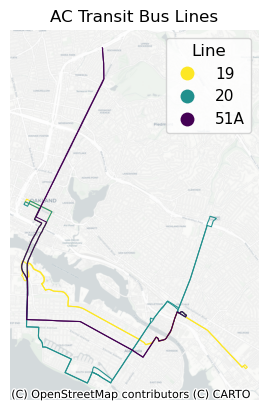

In [5]:
ax_br = bus_routes_wm.plot(column="PUB_RTE", legend=True, linewidth=0.75, cmap="viridis_r",
                          legend_kwds={
                              'loc': 'upper right',
                              'bbox_to_anchor':(1,1),
                              'title': 'Line',
                              'title_fontsize': 12,
                              'fontsize': 11
                         })
ax_br.axis('Off')
cx.add_basemap(ax_br, source=cx.providers.CartoDB.Positron)
plt.title(label="AC Transit Bus Lines",
          fontsize=12,
          color="black");

## Part 1: Analysis of surrounding Census Tracts
We believed that including these variables in our analysis would allow us to understand the demographics of the census tracts that the 19, 20, and 51A lines run along. We specifically decided to create maps pertaining to minorities within these tracts, such as percentage of Black and Asian populations and percentage of low-income households, as these were populations that were more likely to use public transit or depend on transit for their travels. We also mapped out the surrounding tracts by percentage of workers who take public transportation as we perceived this to be a vital trip purpose and one that could benefit from greater travel time predictability in their trip.

To understand the surrounding area, we downloaded Census data on demographics, housing, and transportation characteristics from Social Explorer and used `geopandas`'s `plot` function to make choropleth maps.

In [6]:
census_tracts_data = pd.read_csv("data/census/census_tracts_data.csv")

In [7]:
census_tracts_data = census_tracts_data.dropna(axis=1,how="all")

We first convert the Social Explorer column names to more comprehensible ones.

In [8]:
columns_to_keep = ['Geo_FIPS','SE_A03001_001','SE_A03001_002','SE_A03001_003','SE_A03001_005','SE_A01001_011','SE_A01001_012','SE_A01001_013','SE_A14001_001','SE_A14001_002','SE_A14001_003','SE_A14001_004','SE_A14001_005','SE_A14001_006','SE_A14001_007','SE_A14001_008','SE_A09005_001','SE_A09005_003']
census_tracts_data = census_tracts_data[columns_to_keep]

In [9]:
census_tracts_data.columns = ['FIPS','Total Population','White Alone','Black or African American Alone','Asian Alone','65 to 74 years','75 to 84 years','85 years and above','Households','Less than $10,000','$10,000 to $14,999','$15,000 to $19,999','$20,000 to $24,999','$25,000 to 29,999','$30,000 to $34,999','$35,000 to $39,999','Workers 16 years and over','Public Transportation (Includes Taxicab)']

In [10]:
geom_census_data = pd.read_csv('data/census/bus_route_tracts.csv')

In [11]:
geom_census_data = geom_census_data.rename(columns = {"GEOID":"FIPS"})
geom_census_data = geom_census_data[["FIPS", "geometry"]]

We have two datasets, one with the Social Explorer data, and one that has the tract geometries. We merge these on the `FIPS` column.

In [12]:
joined_census_data = census_tracts_data.merge(right=geom_census_data, on="FIPS")

As there is now a `geometry` column, we convert this dataframe to a geodataframe.

In [13]:
joined_census_data["geometry"] = gpd.GeoSeries.from_wkt(joined_census_data["geometry"])
joined_census_data = gpd.GeoDataFrame(joined_census_data, geometry="geometry")

We create variables for percent Black, percent Asian, percent seniors, percent low income, and percent taking transit using the Social Explorer data, as we believe this is easier to understand than actual counts through choropleth maps. We also use the `contextily` library for their basemaps -- here we've used CartoDB's Positron basemap. We also modify the `alpha` value so that the tracts are more transparent.

In [14]:
joined_census_data['Seniors'] = joined_census_data['65 to 74 years'] + joined_census_data ['75 to 84 years'] + joined_census_data['85 years and above']
joined_census_data['PCT_Seniors'] = joined_census_data['Seniors']/joined_census_data['Total Population']*100

joined_census_data['PCT_Black'] = joined_census_data['Black or African American Alone']/joined_census_data['Total Population']*100

joined_census_data['PCT_Asian'] = joined_census_data['Asian Alone']/joined_census_data['Total Population']*100

joined_census_data['Low_Income'] = joined_census_data['Less than $10,000'] + joined_census_data['$10,000 to $14,999'] + joined_census_data['$15,000 to $19,999'] + joined_census_data['$20,000 to $24,999']+ joined_census_data['$25,000 to 29,999']+ joined_census_data['$30,000 to $34,999']+joined_census_data['$35,000 to $39,999']
joined_census_data['PCT_Low_Income'] = joined_census_data['Low_Income']/joined_census_data['Total Population']*100

joined_census_data['PCT_Take_Transit'] = joined_census_data['Public Transportation (Includes Taxicab)']/joined_census_data['Workers 16 years and over']*100

We were also interested in visualizing the spatial autocorrelation of these tracts, so we've shown the spatial lags side-by-side with the variables of interest.

In [15]:
wq = lps.weights.KNN.from_dataframe(joined_census_data,k=8)
wq.transform = 'r'

In [16]:
joined_census_data['PCT_Seniors_lag'] = lps.weights.lag_spatial(wq, joined_census_data['PCT_Seniors'])
joined_census_data['PCT_Black_lag'] = lps.weights.lag_spatial(wq, joined_census_data['PCT_Black'])
joined_census_data['PCT_Asian_lag'] = lps.weights.lag_spatial(wq, joined_census_data['PCT_Asian'])
joined_census_data['PCT_low_income_lag'] = lps.weights.lag_spatial(wq, joined_census_data['PCT_Low_Income'])
joined_census_data['PCT_Take_Transit_lag'] = lps.weights.lag_spatial(wq, joined_census_data['PCT_Take_Transit'])

/opt/conda/lib/python3.10/site-packages/geopandas/plotting.py:944: UserWarning: You have mixed positional and keyword arguments, some input may be discarded.
  ax.legend(patches, categories, **legend_kwds)
/opt/conda/lib/python3.10/site-packages/geopandas/plotting.py:944: UserWarning: You have mixed positional and keyword arguments, some input may be discarded.
  ax.legend(patches, categories, **legend_kwds)


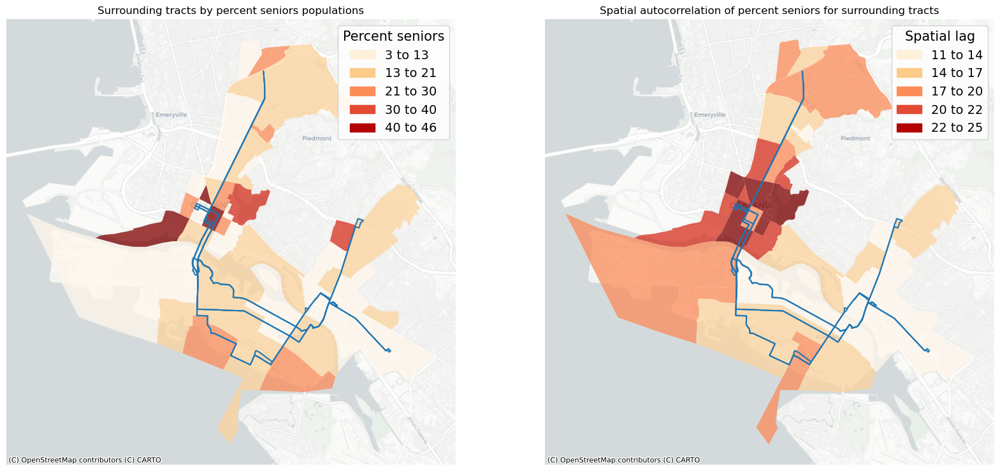

In [17]:
fig_seniors, ax_seniors = plt.subplots(1, 2, figsize=(20, 12))
joined_census_data.plot(ax=ax_seniors[0], 
                        column='PCT_Seniors', 
                        cmap='OrRd', 
                        scheme='UserDefined',
                        classification_kwds={'bins': [13, 21, 30, 40, 46]},
                        k=5, 
                        edgecolor='white', 
                        linewidth=0, 
                        alpha=0.75, 
                        legend=True,
                        legend_kwds={
                            'loc': 'upper right',
                            'bbox_to_anchor':(1,1),
                            'title': 'Percent seniors',
                            'title_fontsize':15,
                            'fontsize':14,
                            'handles':[
                                mpatches.Patch(color='#fef0d9', label='3 to 13'),
                                mpatches.Patch(color='#fdcc8a', label='13 to 21'),
                                mpatches.Patch(color='#fc8d59', label='21 to 30'),
                                mpatches.Patch(color='#e34a33', label='30 to 40'),
                                mpatches.Patch(color='#b30000', label='40 to 46'),
                            ]
})
bus_routes.to_crs("EPSG:3857").plot(ax=ax_seniors[0])
ax_seniors[0].axis("off")
ax_seniors[0].set_title("Surrounding tracts by percent seniors populations")
cx.add_basemap(ax_seniors[0], source=cx.providers.CartoDB.Positron)

joined_census_data.plot(ax=ax_seniors[1], 
                        column='PCT_Seniors_lag', 
                        cmap='OrRd', 
                        scheme='UserDefined',
                        classification_kwds={'bins': [14, 17, 20, 22, 25]},
                        k=5, 
                        edgecolor='white', 
                        linewidth=0, 
                        alpha=0.75,
                        legend=True,
                        legend_kwds={
                            'loc': 'upper right',
                            'bbox_to_anchor':(1,1),
                            'title': 'Spatial lag',
                            'title_fontsize':15,
                            'fontsize':14,
                            'handles':[
                                mpatches.Patch(color='#fef0d9', label='11 to 14'),
                                mpatches.Patch(color='#fdcc8a', label='14 to 17'),
                                mpatches.Patch(color='#fc8d59', label='17 to 20'),
                                mpatches.Patch(color='#e34a33', label='20 to 22'),
                                mpatches.Patch(color='#b30000', label='22 to 25'),
                            ]
})
bus_routes.to_crs("EPSG:3857").plot(ax=ax_seniors[1])
ax_seniors[1].axis("off")
ax_seniors[1].set_title("Spatial autocorrelation of percent seniors for surrounding tracts")
cx.add_basemap(ax_seniors[1], source=cx.providers.CartoDB.Positron)

plt.show()

/opt/conda/lib/python3.10/site-packages/geopandas/plotting.py:944: UserWarning: You have mixed positional and keyword arguments, some input may be discarded.
  ax.legend(patches, categories, **legend_kwds)
/opt/conda/lib/python3.10/site-packages/geopandas/plotting.py:944: UserWarning: You have mixed positional and keyword arguments, some input may be discarded.
  ax.legend(patches, categories, **legend_kwds)


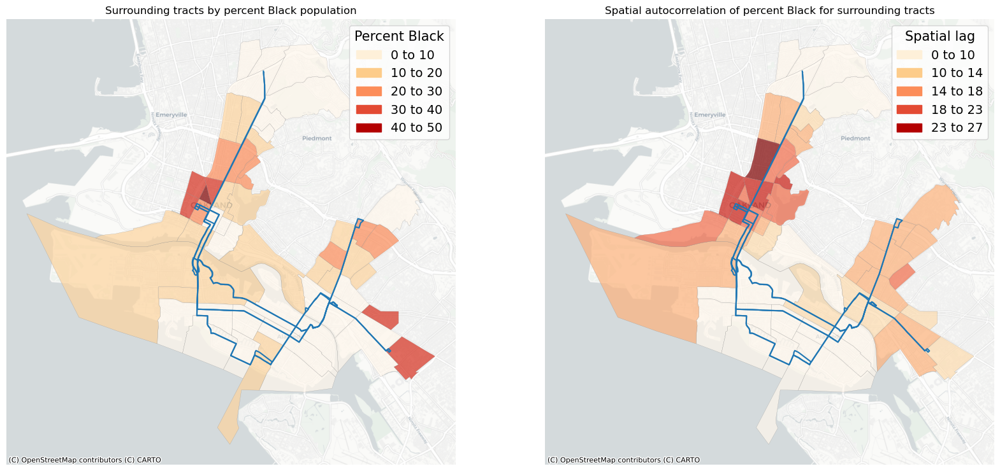

In [18]:
fig_bl, ax_bl = plt.subplots(1, 2, figsize=(20, 12))

joined_census_data.plot(ax=ax_bl[0],
                        column='PCT_Black',
                        legend=True,
                        cmap='OrRd',
                        scheme='UserDefined',
                        k=5,
                        classification_kwds={'bins': [10, 20, 30, 40, 50]},
                        linewidth=0.2,
                        edgecolor='grey',
                        alpha=0.7,
                        legend_kwds={
                            'loc': 'upper right',
                            'bbox_to_anchor':(1,1),
                            'title': 'Percent Black',
                            'title_fontsize':15,
                            'fontsize':14,
                            'handles':[
                                mpatches.Patch(color='#fef0d9', label='0 to 10'),
                                mpatches.Patch(color='#fdcc8a', label='10 to 20'),
                                mpatches.Patch(color='#fc8d59', label='20 to 30'),
                                mpatches.Patch(color='#e34a33', label='30 to 40'),
                                mpatches.Patch(color='#b30000', label='40 to 50'),
                            ]
                        })
bus_routes.to_crs("EPSG:3857").plot(ax=ax_bl[0])
cx.add_basemap(ax_bl[0], source=cx.providers.CartoDB.Positron)

ax_bl[0].axis("off")
ax_bl[0].set_title("Surrounding tracts by percent Black population")

joined_census_data.plot(ax=ax_bl[1], 
                        column='PCT_Black_lag',
                        legend=True,
                        cmap='OrRd',
                        scheme='UserDefined',
                        k=5,
                        classification_kwds={'bins': [10, 14, 18, 23, 27]},
                        linewidth=0.2,
                        edgecolor='grey',
                        alpha=0.7,
                        legend_kwds={
                            'loc': 'upper right',
                            'bbox_to_anchor':(1,1),
                            'title': 'Spatial lag',
                            'title_fontsize':15,
                            'fontsize':14,
                            'handles':[
                                mpatches.Patch(color='#fef0d9', label='0 to 10'),
                                mpatches.Patch(color='#fdcc8a', label='10 to 14'),
                                mpatches.Patch(color='#fc8d59', label='14 to 18'),
                                mpatches.Patch(color='#e34a33', label='18 to 23'),
                                mpatches.Patch(color='#b30000', label='23 to 27'),
                            ]
                        })

bus_routes.to_crs("EPSG:3857").plot(ax=ax_bl[1])
ax_bl[1].axis("off")
ax_bl[1].set_title("Spatial autocorrelation of percent Black for surrounding tracts")
cx.add_basemap(ax_bl[1], source=cx.providers.CartoDB.Positron)

plt.show()

According to a [study on transit ridership done by APTA](https://www.apta.com/wp-content/uploads/Resources/resources/reportsandpublications/Documents/APTA-Who-Rides-Public-Transportation-2017.pdf), the proportions of Black and Asian people that ride public transportation is disproportionately higher compared to their makeup in the US population. These are likely transit-dependent riders that use transit for a variety of trip purposes, including commuting to work. Thus, they would likely benefit from more timely information on their trips.  

In [19]:
joined_census_data['PCT_Asian'] = joined_census_data['Asian Alone']/joined_census_data['Total Population']*100

/opt/conda/lib/python3.10/site-packages/geopandas/plotting.py:944: UserWarning: You have mixed positional and keyword arguments, some input may be discarded.
  ax.legend(patches, categories, **legend_kwds)
/opt/conda/lib/python3.10/site-packages/geopandas/plotting.py:944: UserWarning: You have mixed positional and keyword arguments, some input may be discarded.
  ax.legend(patches, categories, **legend_kwds)


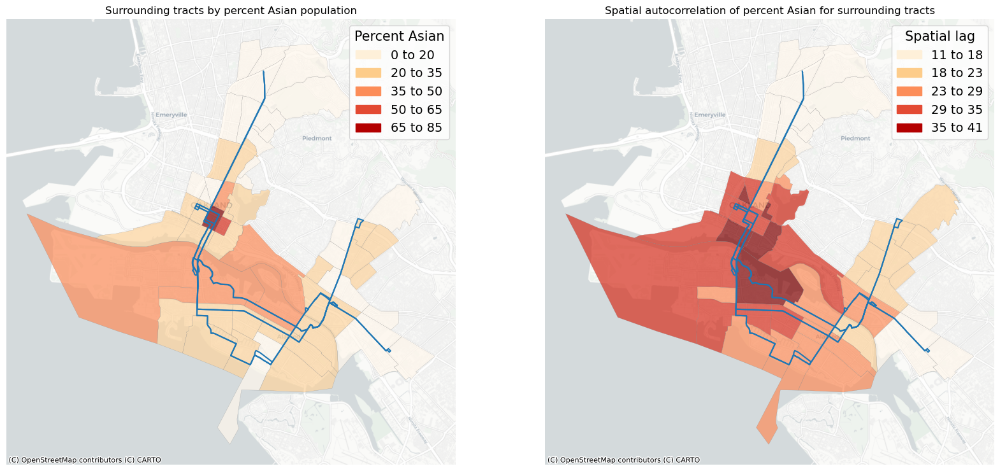

In [20]:
fig_as, ax_as = plt.subplots(1, 2, figsize=(20, 12))

joined_census_data.plot(ax=ax_as[0],
                        column='PCT_Asian',
                        legend=True,
                        cmap='OrRd',
                        scheme='UserDefined',
                        k=5,
                        classification_kwds={'bins': [20, 35, 50, 65, 85]},
                        linewidth=0.2,
                        edgecolor='grey',
                        alpha=0.7,
                        legend_kwds={
                            'loc': 'upper right',
                            'bbox_to_anchor':(1,1),
                            'title': 'Percent Asian',
                            'title_fontsize':15,
                            'fontsize':14,
                            'handles':[
                                mpatches.Patch(color='#fef0d9', label='0 to 20'), 
                                mpatches.Patch(color='#fdcc8a', label='20 to 35'),
                                mpatches.Patch(color='#fc8d59', label='35 to 50'),
                                mpatches.Patch(color='#e34a33', label='50 to 65'),
                                mpatches.Patch(color='#b30000', label='65 to 85')]
                        })
bus_routes.to_crs("EPSG:3857").plot(ax=ax_as[0])
ax_as[0].axis("off")
ax_as[0].set_title("Surrounding tracts by percent Asian population")
cx.add_basemap(ax_as[0], source=cx.providers.CartoDB.Positron)

joined_census_data.plot(ax=ax_as[1], 
                        column='PCT_Asian_lag',
                        legend=True,
                        cmap='OrRd',
                        scheme='UserDefined',
                        k=5,
                        classification_kwds={'bins': [18, 23, 29, 35, 41]},
                        linewidth=0.2,
                        edgecolor='grey',
                        alpha=0.7,
                        legend_kwds={
                            'loc': 'upper right',
                            'bbox_to_anchor':(1,1),
                            'title': 'Spatial lag',
                            'title_fontsize':15,
                            'fontsize':14,
                            'handles':[
                                mpatches.Patch(color='#fef0d9', label='11 to 18'), 
                                mpatches.Patch(color='#fdcc8a', label='18 to 23'),
                                mpatches.Patch(color='#fc8d59', label='23 to 29'),
                                mpatches.Patch(color='#e34a33', label='29 to 35'),
                                mpatches.Patch(color='#b30000', label='35 to 41')]
                        })
bus_routes.to_crs("EPSG:3857").plot(ax=ax_as[1])
ax_as[1].axis("off")
ax_as[1].set_title("Spatial autocorrelation of percent Asian for surrounding tracts")
cx.add_basemap(ax_as[1], source=cx.providers.CartoDB.Positron)

plt.show()

The Bay Area, in specific, also has a large Asian population, [with 27 percent of residents identifying as Asian American or Pacific Islander (AAPI)](https://bayareaequityatlas.org/BayArea-API-diversity). 

/opt/conda/lib/python3.10/site-packages/geopandas/plotting.py:944: UserWarning: You have mixed positional and keyword arguments, some input may be discarded.
  ax.legend(patches, categories, **legend_kwds)
/opt/conda/lib/python3.10/site-packages/geopandas/plotting.py:944: UserWarning: You have mixed positional and keyword arguments, some input may be discarded.
  ax.legend(patches, categories, **legend_kwds)


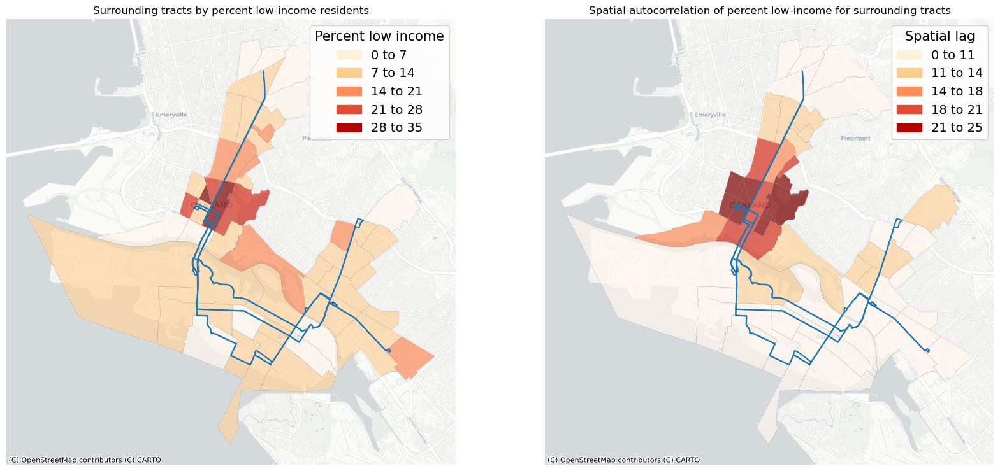

In [21]:
fig_li, ax_li = plt.subplots(1, 2, figsize=(20, 12))

joined_census_data.plot(ax=ax_li[0],
                        column='PCT_Low_Income',
                        legend=True,
                        cmap='OrRd',
                        scheme='UserDefined',
                        k=5,
                        classification_kwds={'bins': [7, 14, 21, 28, 35]},
                        linewidth=0.2,
                        edgecolor='grey',
                        alpha=0.7,
                        legend_kwds={
                            'loc': 'upper right',
                            'bbox_to_anchor':(1,1),
                            'title': 'Percent low income',
                            'title_fontsize':15,
                            'fontsize':14,
                            'handles':[
                                mpatches.Patch(color='#fef0d9', label='0 to 7'), 
                                mpatches.Patch(color='#fdcc8a', label='7 to 14'),
                                mpatches.Patch(color='#fc8d59', label='14 to 21'),
                                mpatches.Patch(color='#e34a33', label='21 to 28'),
                                mpatches.Patch(color='#b30000', label='28 to 35')]
                        })
bus_routes.to_crs("EPSG:3857").plot(ax=ax_li[0])
ax_li[0].axis("off")
ax_li[0].set_title("Surrounding tracts by percent low-income residents")
cx.add_basemap(ax_li[0], source=cx.providers.CartoDB.Positron)

joined_census_data.plot(ax=ax_li[1], 
                        column='PCT_low_income_lag',
                        legend=True,
                        cmap='OrRd',
                        scheme='UserDefined',
                        k=5,
                        classification_kwds={'bins':[11, 14, 18, 21, 25]},
                        linewidth=0.2,
                        edgecolor='grey',
                        alpha=0.7,
                        legend_kwds={
                            'loc': 'upper right',
                            'bbox_to_anchor':(1,1),
                            'title': 'Spatial lag',
                            'title_fontsize':15,
                            'fontsize':14,
                            'handles':[
                                mpatches.Patch(color='#fef0d9', label='0 to 11'), 
                                mpatches.Patch(color='#fdcc8a', label='11 to 14'),
                                mpatches.Patch(color='#fc8d59', label='14 to 18'),
                                mpatches.Patch(color='#e34a33', label='18 to 21'),
                                mpatches.Patch(color='#b30000', label='21 to 25')]
                        })
bus_routes.to_crs("EPSG:3857").plot(ax=ax_li[1])
ax_li[1].axis("off")
ax_li[1].set_title("Spatial autocorrelation of percent low-income for surrounding tracts")
cx.add_basemap(ax_li[1], source=cx.providers.CartoDB.Positron)

plt.show()

We considered low-income households as those with incomes less than than $40,000.

Low-income households are also more likely to be transit-dependent due to the high cost of car ownership and maintenance. Additionally, these households may be less likely to have access to a smartphone or a data plan and may, therefore, rely on static schedules for bus arrival times. Installing real-time information displays in census tracts with high percentages of low-income households could be especially beneficial for these residents as they may have no other means of accessing live bus arrival times. 

In [22]:
joined_census_data['PCT_Take_Transit'] = joined_census_data['Public Transportation (Includes Taxicab)']/joined_census_data['Workers 16 years and over']*100

/opt/conda/lib/python3.10/site-packages/geopandas/plotting.py:944: UserWarning: You have mixed positional and keyword arguments, some input may be discarded.
  ax.legend(patches, categories, **legend_kwds)
/opt/conda/lib/python3.10/site-packages/geopandas/plotting.py:944: UserWarning: You have mixed positional and keyword arguments, some input may be discarded.
  ax.legend(patches, categories, **legend_kwds)


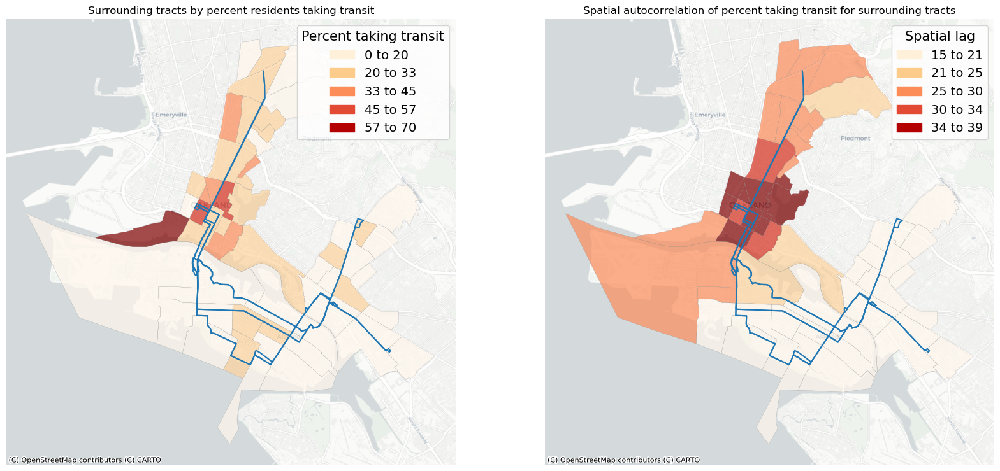

In [23]:
fig_tr, ax_tr = plt.subplots(1, 2, figsize=(20, 12))

joined_census_data.plot(ax=ax_tr[0],
                        column='PCT_Take_Transit',
                        legend=True,
                        cmap='OrRd',
                        scheme='UserDefined',
                        k=5,
                        classification_kwds={'bins': [20, 33, 45, 57, 70]},
                        linewidth=0.2,
                        edgecolor='grey',
                        alpha=0.7,
                        legend_kwds={
                            'loc': 'upper right',
                            'bbox_to_anchor':(1,1),
                            'title': 'Percent taking transit',
                            'title_fontsize':15,
                            'fontsize':14,
                            'handles':[
                                mpatches.Patch(color='#fef0d9', label='0 to 20'), 
                                mpatches.Patch(color='#fdcc8a', label='20 to 33'),
                                mpatches.Patch(color='#fc8d59', label='33 to 45'),
                                mpatches.Patch(color='#e34a33', label='45 to 57'),
                                mpatches.Patch(color='#b30000', label='57 to 70')]
                        })
bus_routes.to_crs("EPSG:3857").plot(ax=ax_tr[0])
ax_tr[0].axis("off")
ax_tr[0].set_title("Surrounding tracts by percent residents taking transit")
cx.add_basemap(ax_tr[0], source=cx.providers.CartoDB.Positron)

joined_census_data.plot(ax=ax_tr[1], 
                        column='PCT_Take_Transit_lag',
                        legend=True,
                        cmap='OrRd',
                        scheme='UserDefined',
                        k=5,
                        classification_kwds={'bins':[21, 25, 30, 34, 39]},
                        linewidth=0.2,
                        edgecolor='grey',
                        alpha=0.7,
                        legend_kwds={
                            'loc': 'upper right',
                            'bbox_to_anchor':(1,1),
                            'title': 'Spatial lag',
                            'title_fontsize':15,
                            'fontsize':14,
                            'handles':[
                                mpatches.Patch(color='#fef0d9', label='15 to 21'), 
                                mpatches.Patch(color='#fdcc8a', label='21 to 25'),
                                mpatches.Patch(color='#fc8d59', label='25 to 30'),
                                mpatches.Patch(color='#e34a33', label='30 to 34'),
                                mpatches.Patch(color='#b30000', label='34 to 39')]
                        })
bus_routes.to_crs("EPSG:3857").plot(ax=ax_tr[1])
ax_tr[1].axis("off")
ax_tr[1].set_title("Spatial autocorrelation of percent taking transit for surrounding tracts")
cx.add_basemap(ax_tr[1], source=cx.providers.CartoDB.Positron)

plt.show()

From looking at these maps, the tracts with more low income households and greater transit ridership do seem to be aligned with those tracts that have more people of color.

While income can serve as a proxy for Internet access, the Census also provides data for Internet access by Census tract. As mentioned before, those without Internet access likely have no other means of obtaining real-time information for bus arrival times and would benefit greatly from real-time information displays.  

In [24]:
internet_smartphone_data = pd.read_csv("data/ACSST5Y2021.S2801-Data.csv")

We cleaned the data by filtering out rows with '-' values, creating a column of FIPS codes, and filtering the dataframe to only include the FIPS code and (renamed) Internet access columns.

In [25]:
internet = internet_smartphone_data[['GEO_ID','S2801_C02_012E']]
internet = internet.tail(-1)
internet = internet[internet['S2801_C02_012E'] != '-']
internet['FIPS'] = internet['GEO_ID'].str[10:]
internet = internet.rename(columns={'S2801_C02_012E': 'Internet access'})
internet['FIPS'] = internet['FIPS'].astype(int)
internet = internet.iloc[:, 1:]

Then, we joined this `internet` dataframe to the previously-made `joined_census_data` dataframe and changed the data in Internet access column to be floats.

In [26]:
joined_census_data = joined_census_data.merge(right=internet, on="FIPS")
joined_census_data['Internet access'] = joined_census_data['Internet access'].astype(float)

/opt/conda/lib/python3.10/site-packages/geopandas/plotting.py:944: UserWarning: You have mixed positional and keyword arguments, some input may be discarded.
  ax.legend(patches, categories, **legend_kwds)


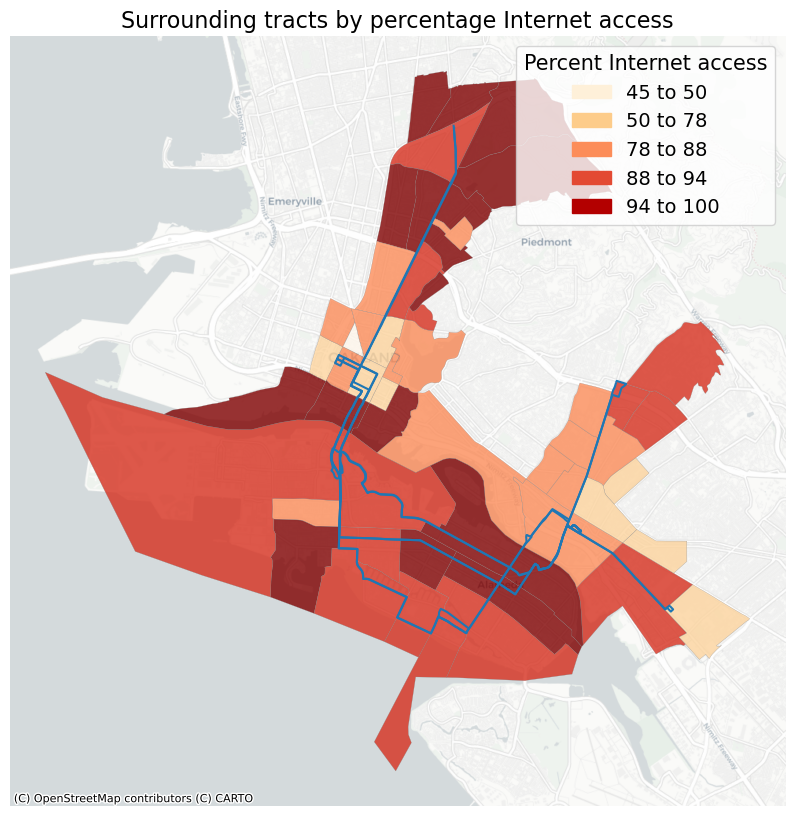

In [27]:
ax_int = joined_census_data.plot(figsize=(12,10),
                         column='Internet access',
                         legend=True,
                         cmap='OrRd',
                         scheme='naturalbreaks',
                         classification_kwds={'bins': [50, 78, 88, 94, 100]},
                         linewidth=0.2,
                         edgecolor='grey',
                         alpha=0.8,
                         legend_kwds={
                              'loc': 'upper right',
                              'bbox_to_anchor':(1,1),
                              'title': 'Percent Internet access',
                              'title_fontsize': 15,
                              'fontsize': 14,
                              'handles':[
                                mpatches.Patch(color='#fef0d9', label='45 to 50'), 
                                mpatches.Patch(color='#fdcc8a', label='50 to 78'),
                                mpatches.Patch(color='#fc8d59', label='78 to 88'),
                                mpatches.Patch(color='#e34a33', label='88 to 94'),
                                mpatches.Patch(color='#b30000', label='94 to 100')]
                         })
plt.title(label="Surrounding tracts by percentage Internet access",
          fontsize=16,
          color="black")
bus_routes.to_crs("EPSG:3857").plot(ax=ax_int)
ax_int.axis("off")
cx.add_basemap(ax_int, source=cx.providers.CartoDB.Positron)

From this map, we can see that many of the tracts with low percentages of Internet access also have high percentages of low-income households, as expected. 

The Census data also provides us with the percentage of smartphone ownership by Census tract, which provides an even more specific way to evaluate access to technology in the area. We believe bus stops serving areas with less smartphone ownership could benefit from real-time information as those riders are less likely to have an easy or convenient way to access bus arrival times compared to those with smartphones.

We performed a similar filtering of the Census dataset as with the Internet access data to obtain smartphone access by Census tract.

In [28]:
smartphone = internet_smartphone_data[['GEO_ID','S2801_C02_005E']]
smartphone = smartphone.tail(-1)
# smartphone = smartphone[smartphone['S2801_C01_005E'] != '']
smartphone['FIPS'] = smartphone['GEO_ID'].str[10:]
smartphone = smartphone.rename(columns={'S2801_C02_005E': 'Smartphone access'})
smartphone['FIPS'] = smartphone['FIPS'].astype(int)
smartphone = smartphone.iloc[:, 1:]

Once again, we joined this `smartphone` dataframe to the `joined_census_data` dataframe and changed the data in smartphone access column to be floats.

In [29]:
joined_census_data = joined_census_data.merge(right=smartphone, on="FIPS")
joined_census_data['Smartphone access'] = joined_census_data['Smartphone access'].astype(float)

/opt/conda/lib/python3.10/site-packages/geopandas/plotting.py:944: UserWarning: You have mixed positional and keyword arguments, some input may be discarded.
  ax.legend(patches, categories, **legend_kwds)


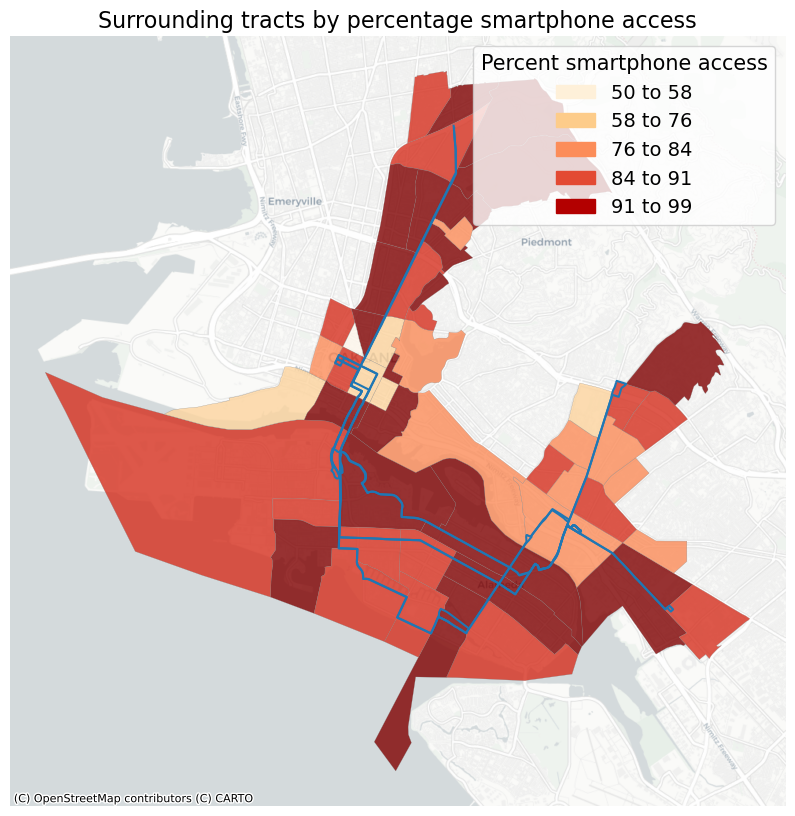

In [30]:
ax_sp = joined_census_data.plot(figsize=(12,10),
                         column='Smartphone access',
                         legend=True,
                         cmap='OrRd',
                         scheme='naturalbreaks',
                         classification_kwds={'bins': [58, 76, 84, 91, 99]},
                         linewidth=0.2,
                         edgecolor='grey',
                         alpha=0.8,
                         legend_kwds={
                              'loc': 'upper right',
                              'bbox_to_anchor':(1,1),
                              'title': 'Percent smartphone access',
                              'title_fontsize': 15,
                              'fontsize': 14,
                              'handles':[
                                mpatches.Patch(color='#fef0d9', label='50 to 58'), 
                                mpatches.Patch(color='#fdcc8a', label='58 to 76'),
                                mpatches.Patch(color='#fc8d59', label='76 to 84'),
                                mpatches.Patch(color='#e34a33', label='84 to 91'),
                                mpatches.Patch(color='#b30000', label='91 to 99')]
                         })
plt.title(label="Surrounding tracts by percentage smartphone access",
          fontsize=16,
          color="black")
bus_routes.to_crs("EPSG:3857").plot(ax=ax_sp)
ax_sp.axis("off")
cx.add_basemap(ax_sp, source=cx.providers.CartoDB.Positron)

Also as expected, Census tracts with low Internet access also had low smartphone ownership. Interestingly, some tracts around Oakland have high Internet access but lower smartphone access. Riders in these tracts could benefit from real-time information displays to access arrival times outside of their homes. 

## Part 2: Ridership

### Boardings

Ridership was another factor we considered in our analysis of which line and bus stops to implement real-time information displays. Initially, it appeared intuitive to prioritize installing displays at bus stops and lines with high ridership, but these lines have higher frequencies that translate to shorter wait times at their stops, reducing the benefit of such displays. Additionally, those without smartphones/Internet access who board at stops with many other transit riders are more likely able to inquire others about bus arrival times than those at stops with only a few riders. Therefore, real-time information displays may actually be more beneficial at lines/stops with more unreliable service and fewer riders.  

We obtained daily average boarding data at each stop for Winter 2022 for each route. We performed some summary statistics on this data by route below. We also split the summary statistics into weekdays, Saturdays, and Sundays and made boxplots for each route to better visualize the distribution of the data.

In [31]:
ridership_data = pd.read_csv('data/ridership/Daily Average Stop Totals by Route_Winter 2022 (for 19_20_51A).csv')
ridership_data['ROUTE'].astype('str');
ridership = ridership_data.copy()
ridership['DAY_OF_WEEK'] = ridership['DAY_OF_WEEK'].replace({'SAT': 'Saturday', 'SUN': 'Sunday', 'WEEKDAY': 'Weekday'})

dab_19 = ridership[ridership['ROUTE'] == '19']
dab_20 = ridership[ridership['ROUTE'] == '20']
dab_51A= ridership[ridership['ROUTE'] == '51A (511)']

/tmp/ipykernel_2859/4026315221.py:1: DtypeWarning: Columns (0,3,4) have mixed types. Specify dtype option on import or set low_memory=False.
  ridership_data = pd.read_csv('data/ridership/Daily Average Stop Totals by Route_Winter 2022 (for 19_20_51A).csv')


In [32]:
lines = ['19','20','51A']
lines_df = [dab_19, dab_20, dab_51A]
for i in range(3):
    print('Summary Statistics for Line ' + lines[i])
    display(lines_df[i]['ON'].describe().round(decimals=2).to_frame().rename(columns={'ON':'Boardings'}))

Summary Statistics for Line 19


,Boardings
count,138.00
mean,3.47
std,6.53
min,0.00
25%,1.00
50%,1.00
75%,3.00
max,47.00


Summary Statistics for Line 20


,Boardings
count,284.00
mean,13.19
std,17.02
min,0.00
25%,3.00
50%,6.00
75%,15.00
max,113.00


Summary Statistics for Line 51A


,Boardings
count,246.00
mean,39.63
std,43.35
min,0.00
25%,12.00
50%,24.00
75%,50.75
max,252.00


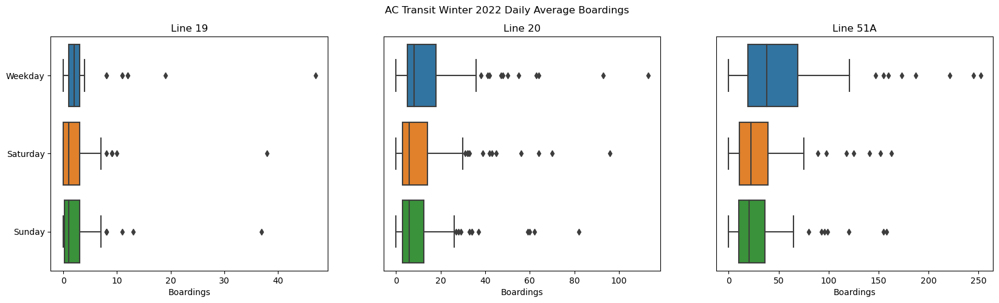

In [33]:
def plot_dab(df, i, line):
    if i !=0:
        fig = sns.boxplot(ax=axes_dab[i], data=lines_df[i], x="ON", y="DAY_OF_WEEK")
        fig.set(xlabel='Boardings', ylabel='', yticklabels=[], title='Line ' + lines[i])
        fig.set_yticks([])
    else:
        fig = sns.boxplot(ax=axes_dab[i], data=lines_df[i], x="ON", y="DAY_OF_WEEK").set(xlabel='Boardings', ylabel='', title='Line ' + lines[i])

fig_dab, axes_dab = plt.subplots(nrows=1, ncols=3, figsize=(20,5))
plot_dab(dab_19, 0, "19")
plot_dab(dab_20, 1, "20")
plot_dab(dab_51A, 2, "51A")
fig_dab.suptitle("AC Transit Winter 2022 Daily Average Boardings");

Stops along the 51A line clearly have the greatest daily average boardings compared to the other two lines. Additionally, the distribution of boardings at bus stops for all three lines seem to be skewed right, with plenty of outliers towards the right tail end of the distribution. Interestingly, line 20 has the greatest number of outliers, suggesting that although the average number of boardings across all of its stops may be low, there is a sizeable number of stops where the passenger boarding is relatively high.

### Highest Ridership Census Tracts

We were then interested in taking a deeper dive into understanding the travel choices of those within census tracts that had the highest number of public transportation users compared to all other tracts. We started out with a plot of the number of public transportation users in the surrounding tracts with the most number of residents using public transportation. Then, we expanded upon our analysis in a later iteration by looking at the mode share of residents within these tracts that had the highest transit ridership. We find that the tracts that have the highest transit ridership also seem to have higher counts of walking and biking. We recognize that taking transit often involves active transportation for first and last mile access, and we believed that these travelers could benefit from greater reliability to minimize their wait time at the stop. Thus, we also used data provided to us by AC Transit to plot the monthly on-time performance of the three lines in 2022, defined by AC Transit as the percentage of trips that departed up to five minutes late. 

Given that there seemed to be some tracts with significantly high transit ridership, we were particularly interested in the mode share of households in the area, and so we determined the five tracts that had the most transit ridership along each bus line. In this file, we show these for the 51A line. We first load the Census data and the dataset containing the geometries and join the two together.

In [34]:
census_data_51a = pd.read_csv("data/51a-tract-data/tracts_data_51a.csv")
geom_data_51a = pd.read_csv("data/51a-tract-data/tracts_51A.csv")
geom_data_51a = geom_data_51a.rename(columns={"GEOID": "FIPS"})
geom_data_51a = geom_data_51a.loc[:, ["FIPS", "geometry"]]
data_51a = census_data_51a.merge(right=geom_data_51a, on="FIPS")

We then make this dataframe a geodataframe.

In [35]:
data_51a["geometry"] = gpd.GeoSeries.from_wkt(data_51a["geometry"])
data_51a = gpd.GeoDataFrame(data_51a, geometry="geometry")

We updated the headers of these columns as they were very long.

In [36]:
modes = ["Drove Alone", "Carpooled", "Public Transportation (Includes Taxicab)", "Motorcycle", "Bicycle", "Walked", "Other Means"]

for i in range(7):
    data_51a = data_51a.rename(columns={"Workers 16 Years and Over: " + modes[i]: modes[i]})

We first determine these top five tracts.

In [37]:
top_5_transit_tracts = data_51a.sort_values(by="Public Transportation (Includes Taxicab)", ascending = False).head(5)

We first plot the count of residents using public transit using `pandas`'s `bar.h` function.

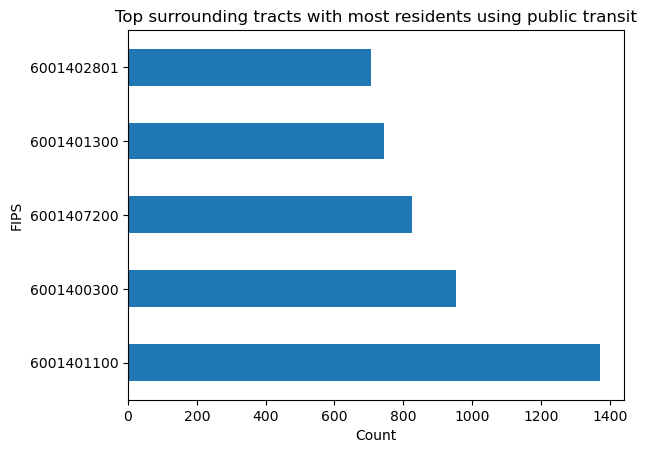

In [38]:
top_5_transit_tracts.plot.barh(x="FIPS",
                            y="Public Transportation (Includes Taxicab)",
                            xlabel="Count",
                            title="Top surrounding tracts with most residents using public transit",
                            legend=False);

As we learned about the `plotly` library the following week, we improved upon the chart by making an interactive bar chart that also showed the overall mode share of these tracts, with the interactivity allowing a viewer to see the specific counts for each mode. We converted our dataframe to be in a "long" dataframe format to work with `plotly`'s `bar` function.

In [39]:
top_5_transit_tracts['Area Name'] = top_5_transit_tracts['Area Name'].str.replace("Census Tract ", "")

In [40]:
top_5_transit_tracts_long = pd.melt(top_5_transit_tracts, id_vars='Area Name', value_vars=modes)

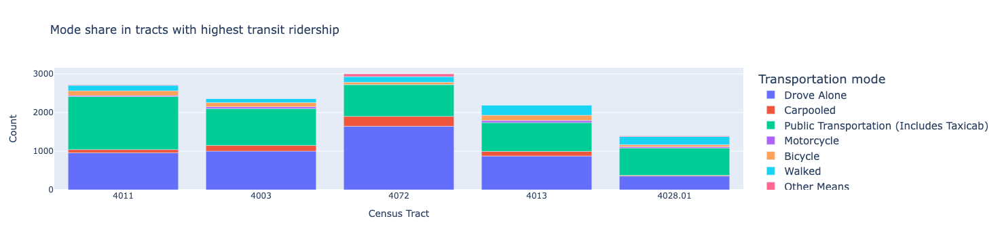

In [41]:
fig_transit_tracts = px.bar(top_5_transit_tracts_long, x="Area Name", y="value", color="variable", 
                            labels={
                                "value": "Count",
                                "variable": "Transportation mode",
                            },
                            title="Mode share in tracts with highest transit ridership")

fig_transit_tracts.update_layout(xaxis_title="Census Tract", legend=dict(font=dict(size=15)))
fig_transit_tracts.show()

We find that the tracts that have the highest transit ridership also seem to have higher counts of walking and biking. We recognize that taking transit often involves active transportation for first and last mile access, .

We reached out to AC Transit for data on delays and performance. They shared with us data on on-time performance for these three lines, which we have ploted below.

In [42]:
otp_19 = pd.read_csv('data/on-time-performance/On Time Performance_Line 19 (2022).csv')
otp_20 = pd.read_csv('data/on-time-performance/On Time Performance_Line 20 (2022).csv')
otp_51A = pd.read_csv('data/on-time-performance/On Time Performance_Line 51A (2022).csv')

In [43]:
def plot_otp(df, i, line):
    df.iloc[:,1] = df.iloc[:,1]*100
    df.iloc[:,2] = df.iloc[:,2]*100
    
    f = df.plot(ax=axes_otp[i], rot=90, legend=False, figsize=(11,5))
    f.set_ylim(ymin=0, ymax=100)

    if i == 0:
        f.set_ylabel("Percent")
    else:
        f.set_yticks([])
        
    f.set_xticks(np.linspace(0,11,12), labels=["Jan", "Feb", "Mar", "Apr", "May", "June", "July", "Aug", "Sep", "Oct", "Nov", "Dec"])
    f.set_title("Line " + line)
    
    if i == 2:
        line_blue = Line2D([0], [0], label='Towards Uptown Oakland', color='#1f77b4')
        line_orange = Line2D([0], [0], label='Towards East Oakland', color='#ff7f0e')
        f.legend(loc = 'lower right', handles=[line_blue, line_orange])
        

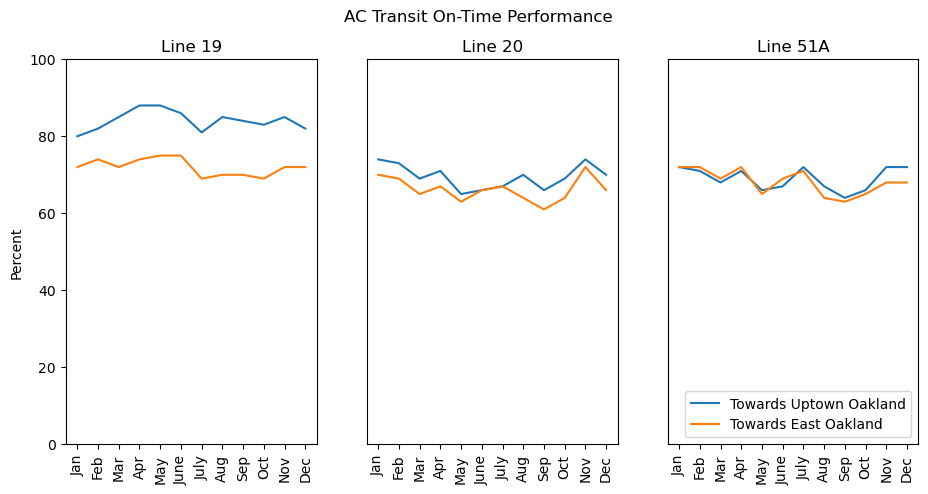

In [44]:
fig_otp, axes_otp = plt.subplots(nrows=1, ncols=3)
plot_otp(otp_19, 0, "19")
plot_otp(otp_20, 1, "20")
plot_otp(otp_51A, 2, "51A")
fig_otp.suptitle("AC Transit On-Time Performance");

### Pedestrian Walksheds

In this exercise, we created several isochrone maps to show the walkshed of bus stops along routes 51A, 19, and 20 that experience heavy passenger use and/or excessive delays (greater than 5 minutes). We used summer weekday average boarding/alighting data for this segment, and the data was collected in 2022.

#### Route 20

First we created the code to produce the isochrone map. We specified the latlon, the mode of transport (i.e. walk), the time intervals and the speed (and hence distance) at which the pedestrians will walk. We also found the center node by calculating the centroid and bounding coordinates. Then, we created a list of time/colors and reversed the order to make sure the longest walk times are at the edge. Next, we specified the polygons for each time area and reversed the colors so the outer polygon gets drawn first. Finally, we created the subplots, specified the isochrone boundaries, built a loop of the time and corresponding color, and added the center node legend and basemap. 

This bus stop sees around an average of 19 boardings on a summer weekday and experiences delays of 5 minutes or more.

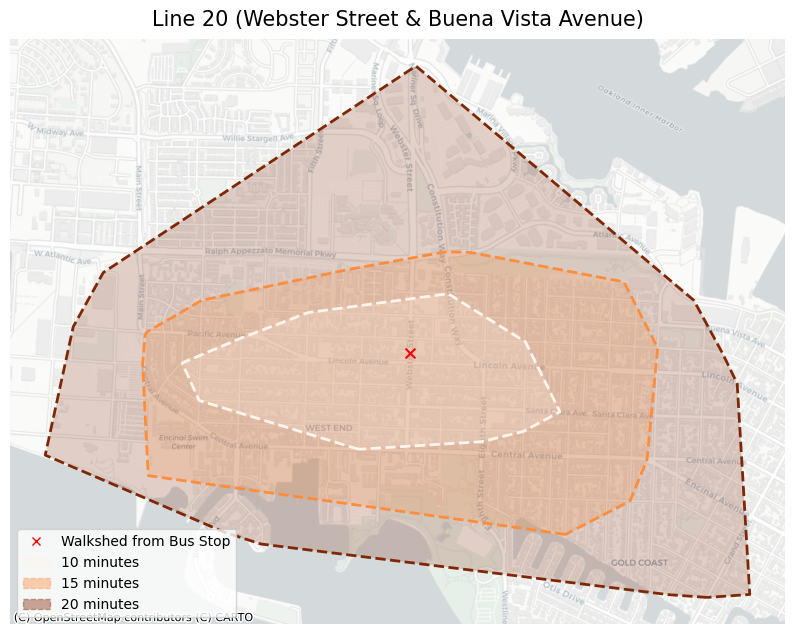

In [45]:
latlon = [37.777649171356565, -122.27653651924717]
network_type = 'walk'
trip_times = [10,15,20] 
meters_per_minute = 75 
cmap = 'Oranges'
title = 'Line 20 (Webster Street & Buena Vista Avenue)'

G = ox.graph_from_point(latlon, network_type=network_type, dist = 2000)

G = ox.project_graph(G, to_crs='epsg:3857')

gdf_nodes, gdf_edges = ox.graph_to_gdfs(G)

minx, miny, maxx, maxy = gdf_nodes.geometry.total_bounds

centroid_x = (maxx-minx)/2 + minx
centroid_y = (maxy-miny)/2 + miny

center_node = ox.distance.nearest_nodes(G,Y=centroid_y,X=centroid_x)

gdf_edges['walk_time'] = gdf_edges['length']/meters_per_minute

iso_colors = ox.plot.get_colors(n=len(trip_times), 
                                cmap=cmap, 
                                start=0, 
                                return_hex=True)

time_color = list(zip(trip_times, iso_colors))

time_color.reverse()

for time, color in list(time_color):   
    subgraph = nx.ego_graph(G, center_node, radius=time)    
    for node in subgraph.nodes():
        gdf_nodes.loc[node,'time'] = time
        gdf_nodes.loc[node,'color'] = color
        
gdf_nodes['color'].fillna('#cccccc', inplace=True)

isochrones = gdf_nodes.dissolve(by = "time")

isochrones = isochrones.convex_hull.reset_index(name='geometry')

isochrones.sort_values(by='time', ascending=False,inplace=True)

iso_colors.reverse()

fig, ax = plt.subplots(figsize=(10,15))

isochrones.boundary.plot(
    ax=ax,
    alpha=1,
    linestyle='--',
    color=iso_colors,
    lw=2
    ) 

isochrones.plot(
    ax=ax, 
    alpha=0.2, 
    categorical=True, 
    color=iso_colors,
    )

gdf_nodes.loc[[center_node]].plot(
    ax=ax,
    color='r',
    marker='x',
    markersize=50
    )

legend_elements = [ 
    Line2D([0], [0], marker='x', color='red', linestyle='',label='Walkshed from Bus Stop', markersize=6),
    ]

time_color.reverse()

for time,color in list(time_color):
    legend_item = Patch(facecolor=color, edgecolor=color, linestyle='--',linewidth=1,label=str(time)+' minutes',alpha=0.4)
    legend_elements.append(legend_item)

ax.legend(handles=legend_elements,loc='lower left') 

ax.set_title(title,fontsize=15,pad=10)

ax.axis('off')

cx.add_basemap(ax,source=cx.providers.CartoDB.Positron)

Next we created a function to avoid having to repeat the code over and over again. We set the latlon, cmap and title to the argument def isomap so that all we needed to do was to specify these querries in the next round.

In [46]:
def isomap(latlon=[37.777649171356565, -122.27653651924717],cmap='Oranges', title='Line 20 (Webster Street & Buena Vista Avenue)'):
    latlon = latlon
    network_type = 'walk'
    trip_times = [10,15,20] 
    meters_per_minute = 75 
    cmap = cmap
    title = title

    G = ox.graph_from_point(latlon, network_type=network_type, dist = 2000)

    G = ox.project_graph(G, to_crs='epsg:3857')

    gdf_nodes, gdf_edges = ox.graph_to_gdfs(G)

    minx, miny, maxx, maxy = gdf_nodes.geometry.total_bounds

    centroid_x = (maxx-minx)/2 + minx
    centroid_y = (maxy-miny)/2 + miny

    center_node = ox.distance.nearest_nodes(G,Y=centroid_y,X=centroid_x)

    gdf_edges['walk_time'] = gdf_edges['length']/meters_per_minute

    iso_colors = ox.plot.get_colors(n=len(trip_times), 
                                    cmap=cmap, 
                                    start=0, 
                                    return_hex=True)

    time_color = list(zip(trip_times, iso_colors))

    time_color.reverse()

    for time, color in list(time_color):  
        subgraph = nx.ego_graph(G, center_node, radius=time) 
        for node in subgraph.nodes():
            gdf_nodes.loc[node,'time'] = time
            gdf_nodes.loc[node,'color'] = color
    gdf_nodes['color'].fillna('#cccccc', inplace=True)

    isochrones = gdf_nodes.dissolve(by = "time")

    isochrones = isochrones.convex_hull.reset_index(name='geometry')

    isochrones.sort_values(by='time', ascending=False,inplace=True)

    iso_colors.reverse()

    fig, ax = plt.subplots(figsize=(10,15))

    isochrones.boundary.plot(
        ax=ax,
        alpha=1,
        linestyle='--',
        color=iso_colors,
        lw=2
        ) 

    isochrones.plot(
        ax=ax, 
        alpha=0.2, 
        categorical=True, 
        color=iso_colors,
        )

    gdf_nodes.loc[[center_node]].plot(
        ax=ax,
        color='r',
        marker='x',
        markersize=50
        )

    legend_elements = [
    
        Line2D([0], [0], marker='x', color='red', linestyle='',label='Walkshed from Bus Stop', markersize=6),
        ]

    time_color.reverse()

    for time,color in list(time_color):
        legend_item = Patch(facecolor=color, edgecolor=color, linestyle='--',linewidth=1,label=str(time)+' minutes',alpha=0.4)
        legend_elements.append(legend_item)

    ax.legend(handles=legend_elements,loc='lower left') 

    ax.set_title(title,fontsize=15,pad=10)

    ax.axis('off')

    cx.add_basemap(ax,source=cx.providers.CartoDB.Positron)

Now we can create maps from just inputting the relevant lat/lons, cmap, and title.

This bus stop sees an average of 37 daily boardings on a summer weekday and experiences delays of 5 minutes or more.

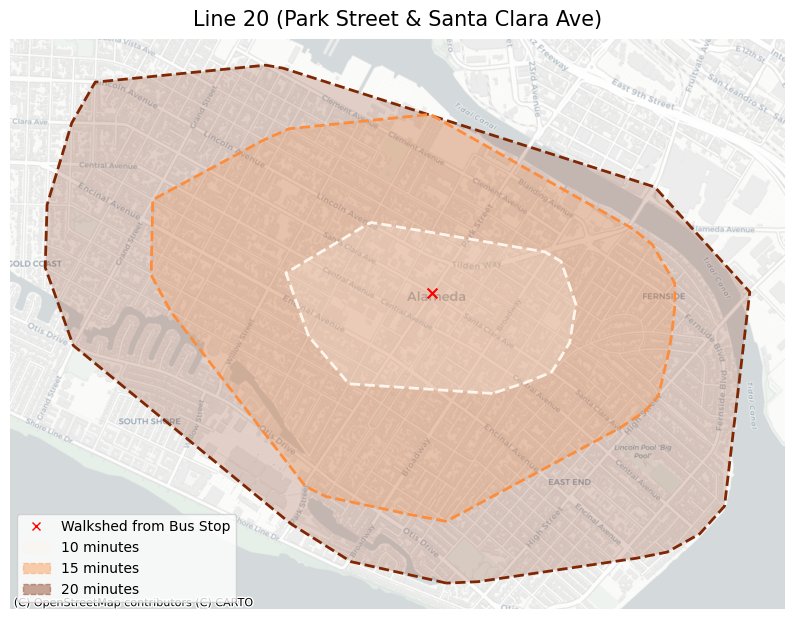

In [47]:
isomap(latlon=[37.76525044249728, -122.24212123646979], cmap='Oranges', title= 'Line 20 (Park Street & Santa Clara Ave)')

This bus stop sees the heaviest use of an average of 55 passenger boardings per day during summer weekdays and experiences delays of 5 minutes or more.

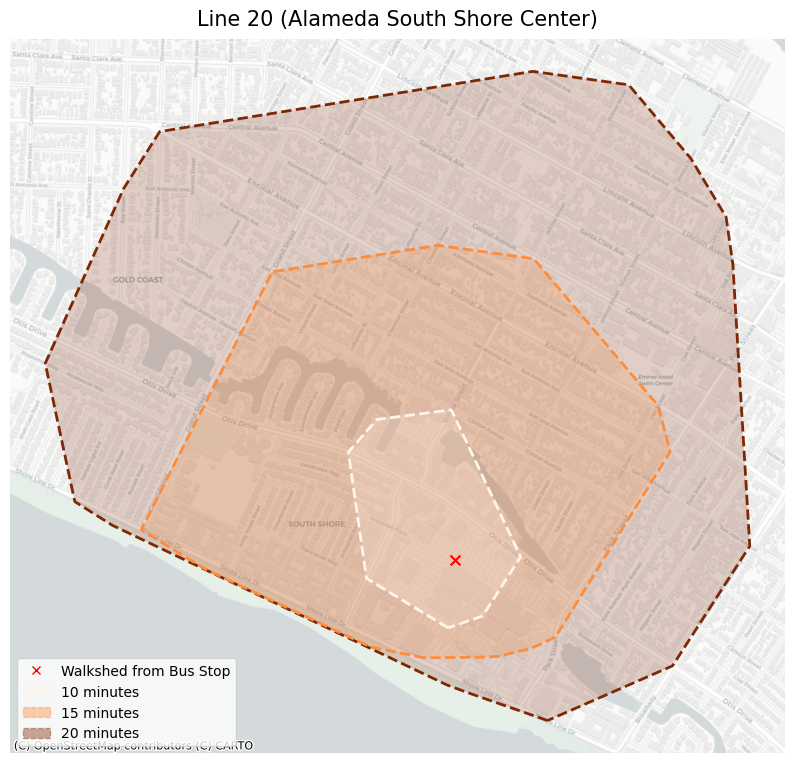

In [48]:
isomap(latlon=[37.75872168546182, -122.25276060928036], cmap='Oranges', title= 'Line 20 (Alameda South Shore Center)')

#### Route 51A

While this bus stop, Broadway and 12th, is not necessarily delay-prone, it sees a whopping average of 112 passenger boardings per summer weekday.

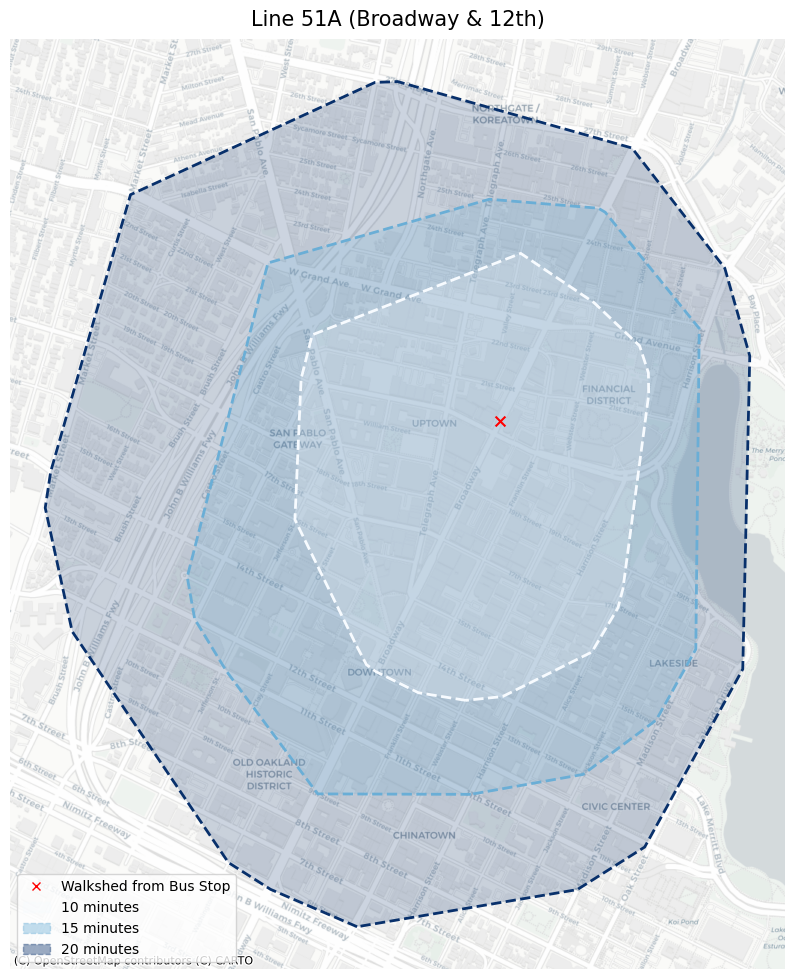

In [49]:
isomap(latlon=[37.809371094799374, -122.26794248548805], cmap='Blues', title= 'Line 51A (Broadway & 12th)')

These last two stops experience delays and see around an average of 35 passenger boardings per summer weekday.

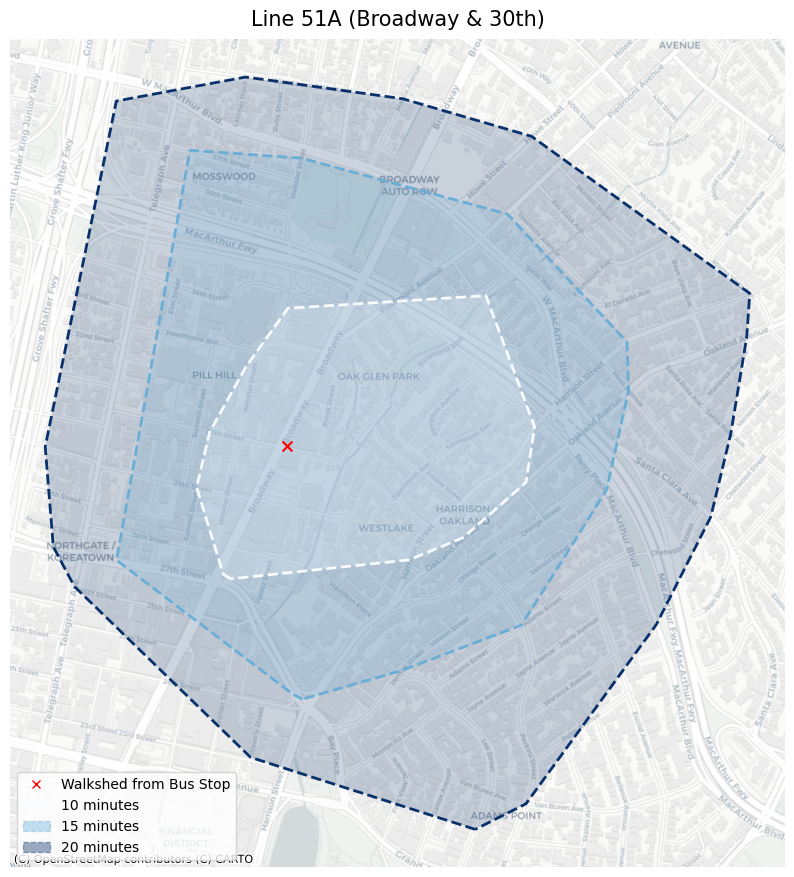

In [50]:
isomap(latlon=[37.818851182970235, -122.26202176824387], cmap='Blues', title= 'Line 51A (Broadway & 30th)')

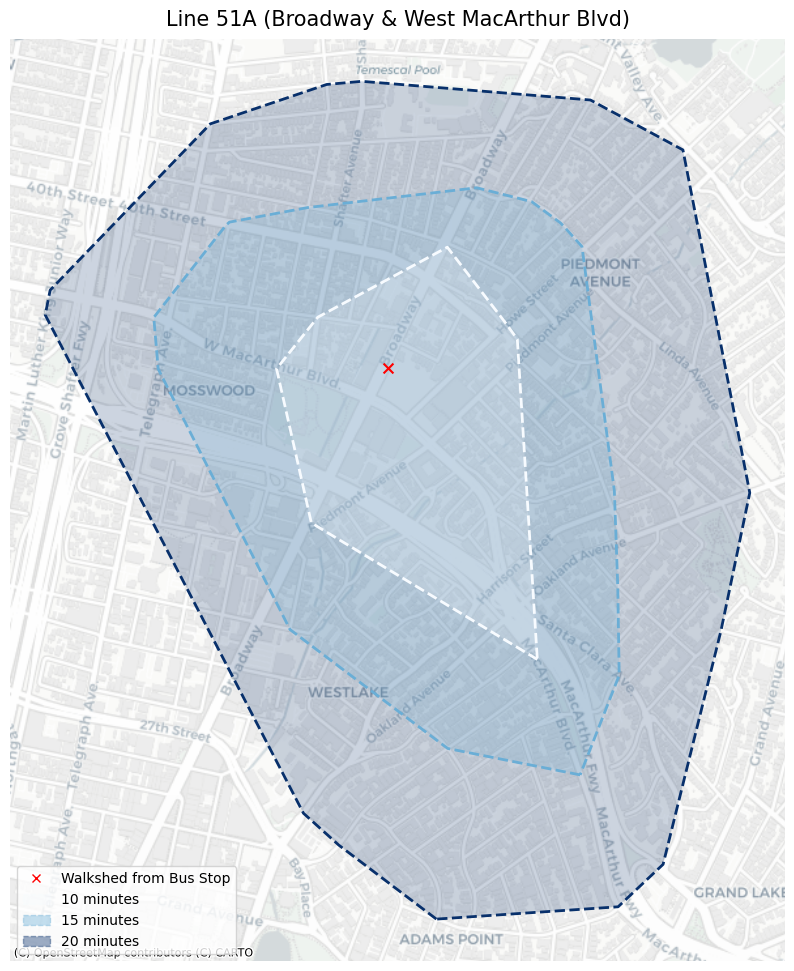

In [51]:
isomap(latlon=[37.82492760092457, -122.2581806241156], cmap='Blues', title= 'Line 51A (Broadway & West MacArthur Blvd)')

## Part 3: Real-time delays

Finally, we decided to map out the bus stops within each of the three lines with average delays that exceeded AC Transit’s on-time performance threshold of five minutes. We hoped to create these maps to help us decide which stops within the most unreliable line would benefit from real-time information displays.  

We collected real-time transit data via Open 511 SIRI APIs. This data is provided in an XML format and has information such as bus expected and aimed arrival and departure times. To determine which stops have the greatest average delays, we are gathering this real-time delay data during different times of day (peak and off-peak, AM and PM) throughout the week. The following interactive maps show bus stops with average delays over five minutes, during Sunday afternoons.

In [52]:
stops_shp_file = gpd.read_file('data/bus-stops/UniqueStops_Fall22.shp')
stops_shp_file.to_file('data/bus-stops/UniqueStops_Fall22.shp', driver='GeoJSON')

We had shapefiles with data on all bus stops from AC Transit's Data and Resource Center, and we had previously filtered these by line for the three bus lines we consider.

In [53]:
delays_19 = pd.read_csv('data/real-time-delays/Line 19.csv')
delays_20 = pd.read_csv('data/real-time-delays/Line 20.csv')
delays_51A = pd.read_csv('data/real-time-delays/Line 51A.csv')

We join these bus stops associated with each line to the shapefile that has a `geometry` column for us to plot.

In [54]:
joined_geom_data_19 = delays_19.merge(stops_shp_file, left_on='stop_code', right_on='stp_511_id', how = 'left')
joined_geom_data_20 = delays_20.merge(stops_shp_file, left_on='stop_code', right_on='stp_511_id', how = 'left')
joined_geom_data_51A = delays_51A.merge(stops_shp_file, left_on='stop_code', right_on='stp_511_id', how = 'left')

The following function takes in a geodataframe and filters it so that the remaining rows are only those stops that have average delays of greater than five minutes.

In [55]:
def filter_for_delays(geom_data):
    geom_data = geom_data.replace(0, np.NaN)
    geom_data['Average Delay'] = geom_data.iloc[:,22:40].mean(axis=1)
    geom_data = geom_data[(geom_data.iloc[:,-1:] > 300).squeeze()]
    geom_data = geom_data[(geom_data['geometry'] != None).squeeze()]
    geom_data['lon'] = geom_data.geometry.apply(lambda p: p.x)
    geom_data['lat'] = geom_data.geometry.apply(lambda p: p.y)
    
    return geom_data

The following function takes in a geodataframe and plots the filtered stops.

In [56]:
def generate_map(geom_data, line):
    filtered_geom_data = filter_for_delays(geom_data)
    fig = px.scatter_mapbox(
                    filtered_geom_data,
                    lat='lat',
                    lon='lon',
                    zoom=12,
                    hover_name='stop_name',
                    hover_data=["Average Delay"],
                    mapbox_style="carto-positron")
    # options on the layout
    fig.update_layout(
        width = 800,
        height = 800,
        title='Line ' + line,
        title_x=0.5
    )
    return fig

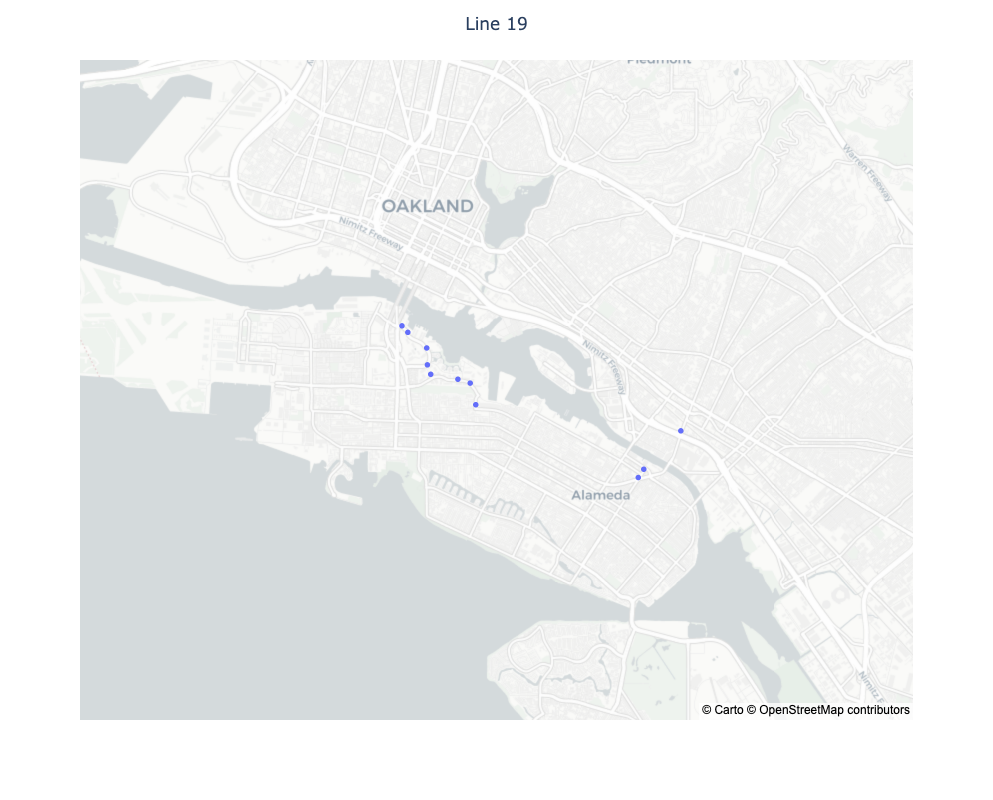

In [57]:
map_19 = generate_map(joined_geom_data_19, "19")
map_19

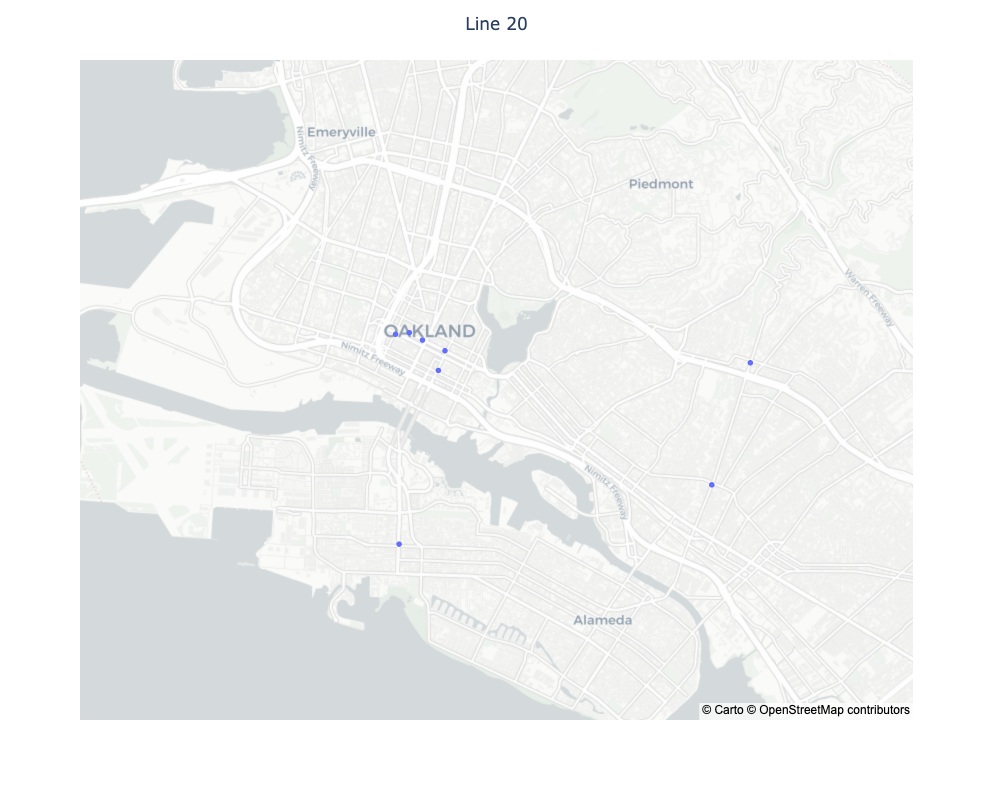

In [58]:
map_20 = generate_map(joined_geom_data_20, "20")
map_20

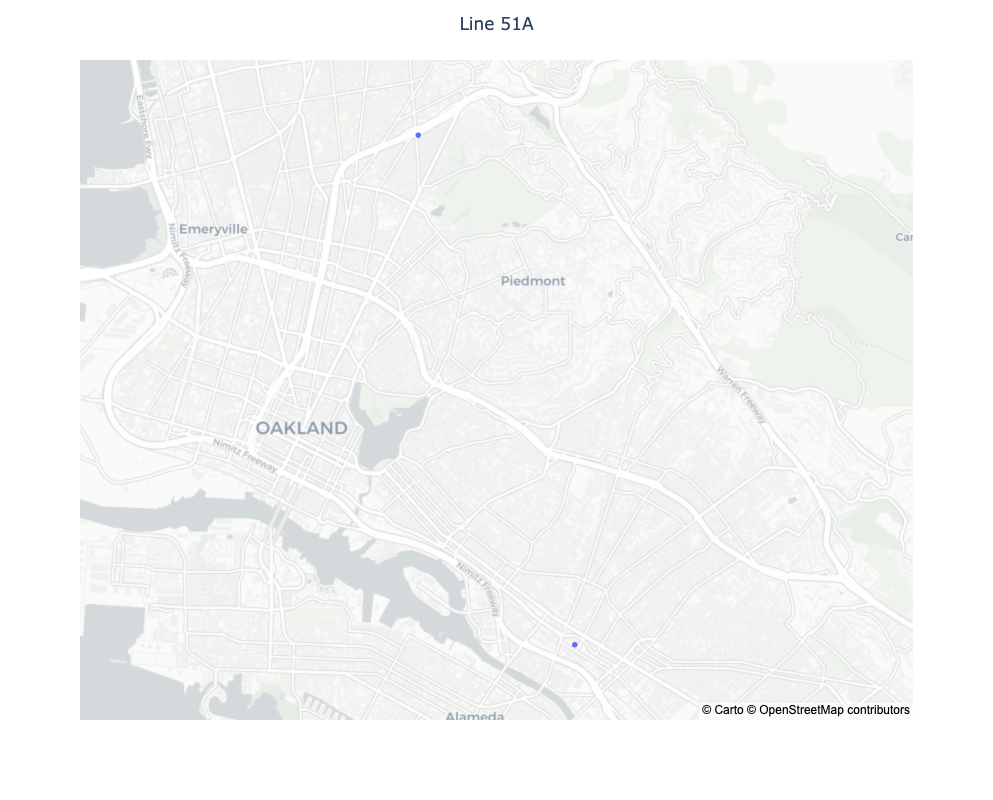

In [59]:
map_51A = generate_map(joined_geom_data_51A, "51A")
map_51A

As we can see from the maps above, line 20 has the most delays. This is interesting as the 20 actually does not run as frequently as the 51A or as infrequently as the 19. However, this might make it more burdensome for riders waiting for the 20 at bus stops, as riders cannot expect the regularity of the 51A and may be waiting at the stop for longer periods of time than expected. We found it impressive that the 19 had no significant delay during our analysis period, but this suggests that the stops along that line may not particularly benefit from real-time information. 

## Part 4: Accessibility

To determine accessibility to important destinations, we looked at community anchor institutions in the surrounding area. Specifically, we considered distance of bus stops to the nearest child care, healthcare, and elderly care centers for each line, which we deemed as necessities for many families. This data came from the California Public Utilities Commission. 

In [60]:
anchor_data = gpd.read_file("./data/community-anchor-points/CPUC_Anchor_Institutions_2021.shp")

To reduce the size of the dataset to find the nearest anchor points, we filtered it to be only those located in Alameda and Oakland.

In [61]:
anchor_data = anchor_data[(anchor_data["CITY"] == "ALAMEDA") | (anchor_data["CITY"] == "OAKLAND")]

In [62]:
anchor_data["CAIType"].value_counts().head()

Child Care Centers - DAY CARE CENTER                              188
Healthcare Facilities - PRIMARY CARE CLINIC                        82
Adult Residential Facilities - ADULT RESIDENTIAL                   45
Child Care Centers - INFANT CENTER                                 39
Elderly Residential Care Facilities - RESIDENTIAL CARE ELDERLY     35
Name: CAIType, dtype: int64

While there were many categories of anchor point centers, we chose three that were among the most common -- child care (day care), healthcare (primary care), and elderly residential care.

#### Bus stops for the three lines

As we want to look at distance of these facilities from each bus stop, we load in this data.

In [63]:
stops_19 = gpd.read_file("./data/bus-stops-19/bus_stops_19.shp")
stops_20 = gpd.read_file("./data/bus-stops-20/bus_stops_20.shp")
stops_51a = gpd.read_file("./data/bus-stops-51a/bus_stops_51A.shp")

We defined the minimum and maximum latitudes and longitudes for our map to show the region covered by the three bus lines.

In [64]:
minx = -13616000
miny = 4544000
maxx = -13604000
maxy = 4558000

#### Distance to nearest child care centers

In [65]:
child_care_data = anchor_data[anchor_data["CAIType"] == "Child Care Centers - DAY CARE CENTER"]

In [ ]:
ax_child_care = child_care_data.plot(markersize=2)
cx.add_basemap(ax_child_care, source=cx.providers.CartoDB.Positron)
ax_child_care.axis("off")

For each route, we performed a spatial join to determine the nearest child care center to each bus stop of that line. We then plotted these distance values.

In [ ]:
stops_19_child_care = (stops_19.to_crs(3857)).sjoin_nearest(right=child_care_data, how="left", distance_col="distance")

In [ ]:
stops_20_child_care = (stops_20.to_crs(3857)).sjoin_nearest(right=child_care_data, how="left", distance_col="distance")

In [ ]:
stops_51a_child_care = (stops_51a.to_crs(3857)).sjoin_nearest(right=child_care_data, how="left", distance_col="distance")

In [ ]:
fig_cc, ax_cc = plt.subplots(1, 3, figsize=(26, 10))

ax_19_child_care = stops_19_child_care.plot(ax=ax_cc[0],
                                            column="distance",
                                            scheme='UserDefined',
                                            classification_kwds={'bins': [100, 270, 440, 600, 770, 950]},
                                            legend=True,
                                            legend_kwds={
                                                  'loc': 'upper right',
                                                  'bbox_to_anchor':(1,1),
                                                  'title': 'Distance (m)',
                                                  'title_fontsize': 12,
                                                  'fontsize': 10,
                                                  'handles': [
                                                        mpatches.Patch(color='#440154', label='100 to 270'), 
                                                        mpatches.Patch(color='#3b528b', label='270 to 440'),
                                                        mpatches.Patch(color='#21918c', label='440 to 600'),
                                                        mpatches.Patch(color='#5ec962', label='600 to 770'),
                                                        mpatches.Patch(color='#fde725', label='770 to 950')]}
                                           )

ax_19_child_care.set_xlim(minx, maxx)
ax_19_child_care.set_ylim(miny, maxy)
ax_19_child_care.axis("off")
ax_19_child_care.set_title("Line 19")
cx.add_basemap(ax_19_child_care, source=cx.providers.CartoDB.Positron)

ax_20_child_care = stops_20_child_care.plot(ax=ax_cc[1],
                                            column="distance",
                                            scheme='UserDefined',
                                            classification_kwds={'bins': [80, 390, 700, 1000, 1300, 1600]},
                                            legend=True,
                                            legend_kwds={
                                                  'loc': 'upper right',
                                                  'bbox_to_anchor':(1,1),
                                                  'title': 'Distance (m)',
                                                  'title_fontsize': 12,
                                                  'fontsize': 10,
                                                  'handles': [
                                                            mpatches.Patch(color='#440154', label='80 to 390'),
                                                            mpatches.Patch(color='#3b528b', label='390 to 700'),
                                                            mpatches.Patch(color='#21918c', label='700 to 1000'),
                                                            mpatches.Patch(color='#5ec962', label='1000 to 1300'),
                                                            mpatches.Patch(color='#fde725', label='1300 to 1600')]}
                                           )

ax_20_child_care.set_xlim(minx, maxx)
ax_20_child_care.set_ylim(miny, maxy)
ax_20_child_care.axis("off")
ax_20_child_care.set_title("Line 20")
cx.add_basemap(ax_20_child_care, source=cx.providers.CartoDB.Positron)

ax_51a_child_care = stops_51a_child_care.plot(ax=ax_cc[2],
                                            column="distance",
                                            scheme='UserDefined',
                                            classification_kwds={'bins': [25, 190, 340, 500, 660, 820]},
                                            legend=True,
                                            legend_kwds={
                                                  'loc': 'upper right',
                                                  'bbox_to_anchor':(1,1),
                                                  'title': 'Distance (m)',
                                                  'title_fontsize': 12,
                                                  'fontsize': 10,
                                                  'handles': [
                                                        mpatches.Patch(color='#440154', label='25 to 190'),
                                                        mpatches.Patch(color='#3b528b', label='190 to 340'),
                                                        mpatches.Patch(color='#21918c', label='340 to 500'),
                                                        mpatches.Patch(color='#5ec962', label='500 to 660'),
                                                        mpatches.Patch(color='#fde725', label='660 to 820')]
                                            }
                                           )

ax_51a_child_care.set_xlim(minx, maxx)
ax_51a_child_care.set_ylim(miny, maxy)
ax_51a_child_care.axis("off")
ax_51a_child_care.set_title("Line 51A")
cx.add_basemap(ax_51a_child_care, source=cx.providers.CartoDB.Positron)

fig_cc.suptitle("Distance to nearest child care center", fontsize=14);

We found that the nearest child care locations were much farther for stops along Line 20 compared to the other lines, although Line 51A did have variability in distance to child care throughout at its stops.

#### Distance to nearest healthcare center

We repeat the same procedure for healthcare centers.

In [ ]:
healthcare_data = anchor_data[anchor_data["CAIType"] == "Healthcare Facilities - PRIMARY CARE CLINIC"]

In [ ]:
ax_healthcare = healthcare_data.plot(markersize=2)
cx.add_basemap(ax_healthcare, source=cx.providers.CartoDB.Positron)
ax_healthcare.axis("off")

For each route, we performed a spatial join to determine the nearest healthcare center to each bus stop of that line. We then plotted these distance values.

In [ ]:
stops_19_healthcare = (stops_19.to_crs(3857)).sjoin_nearest(right=healthcare_data, how="left", distance_col="distance")

In [ ]:
stops_20_healthcare = (stops_20.to_crs(3857)).sjoin_nearest(right=healthcare_data, how="left", distance_col="distance")

In [ ]:
stops_51a_healthcare = (stops_51a.to_crs(3857)).sjoin_nearest(right=healthcare_data, how="left", distance_col="distance")

In [ ]:
fig_hc, ax_hc = plt.subplots(1, 3, figsize=(26, 10))

ax_19_healthcare = stops_19_healthcare.plot(ax=ax_hc[0],
                                            column="distance",
                                            scheme='UserDefined',
                                            classification_kwds={'bins': [55, 360, 670, 970, 1270, 1580]},
                                            legend=True,
                                            legend_kwds={
                                                  'loc': 'upper right',
                                                  'bbox_to_anchor':(1,1),
                                                  'title': 'Distance (m)',
                                                  'title_fontsize': 12,
                                                  'fontsize': 10,
                                                  'handles': [
                                                        mpatches.Patch(color='#440154', label='55 to 360'),
                                                        mpatches.Patch(color='#3b528b', label='360 to 670'),
                                                        mpatches.Patch(color='#21918c', label='670 to 970'),
                                                        mpatches.Patch(color='#5ec962', label='970 to 1270'),
                                                        mpatches.Patch(color='#fde725', label='1270 to 1580')]
                                            })

ax_19_healthcare.set_xlim(minx, maxx)
ax_19_healthcare.set_ylim(miny, maxy)
ax_19_healthcare.axis("off")
ax_19_healthcare.set_title("Line 19")
cx.add_basemap(ax_19_healthcare, source=cx.providers.CartoDB.Positron)

ax_20_healthcare = stops_20_healthcare.plot(ax=ax_hc[1],
                                            column="distance",
                                            scheme='UserDefined',
                                            classification_kwds={'bins': [55, 430, 800, 1170, 1540, 1910]},
                                            legend=True,
                                            legend_kwds={
                                                  'loc': 'upper right',
                                                  'bbox_to_anchor':(1,1),
                                                  'title': 'Distance (m)',
                                                  'title_fontsize': 12,
                                                  'fontsize': 10,
                                                  'handles': [
                                                        mpatches.Patch(color='#440154', label='55 to 430'),
                                                        mpatches.Patch(color='#3b528b', label='430 to 800'),
                                                        mpatches.Patch(color='#21918c', label='800 to 1170'),
                                                        mpatches.Patch(color='#5ec962', label='1170 to 1540'),
                                                        mpatches.Patch(color='#fde725', label='1540 to 1910')]
                                            })

ax_20_healthcare.set_xlim(minx, maxx)
ax_20_healthcare.set_ylim(miny, maxy)
ax_20_healthcare.axis("off")
ax_20_healthcare.set_title("Line 20")
cx.add_basemap(ax_20_healthcare, source=cx.providers.CartoDB.Positron)

ax_51a_healthcare = stops_51a_healthcare.plot(ax=ax_hc[2],
                                            column="distance",
                                            scheme='UserDefined',
                                            classification_kwds={'bins': [15, 370, 710, 1060, 1400, 1760]},
                                            legend=True,
                                            legend_kwds={
                                                  'loc': 'upper right',
                                                  'bbox_to_anchor':(1,1),
                                                  'title': 'Distance (m)',
                                                  'title_fontsize': 12,
                                                  'fontsize': 10,
                                                  'handles': [
                                                        mpatches.Patch(color='#440154', label='15 to 370'),
                                                        mpatches.Patch(color='#3b528b', label='370 to 710'),
                                                        mpatches.Patch(color='#21918c', label='710 to 1060'),
                                                        mpatches.Patch(color='#5ec962', label='1060 to 1400'),
                                                        mpatches.Patch(color='#fde725', label='1400 to 1760')]
                                            })

ax_51a_healthcare.set_xlim(minx, maxx)
ax_51a_healthcare.set_ylim(miny, maxy)
ax_51a_healthcare.axis("off")
ax_51a_healthcare.set_title("Line 51A")
cx.add_basemap(ax_51a_healthcare, source=cx.providers.CartoDB.Positron)

All three lines have significant variability in the distance to nearest healthcare, especially stops in Alameda and those in the Rockridge neighborhood of Oakland. The stops in Alameda, particularly for Line 19, are quite far from healthcare facilities, up to 1910 meters away.

#### Distance to nearest elderly residential care facilities

In [ ]:
elderly_care_data = anchor_data[anchor_data["CAIType"] == "Elderly Residential Care Facilities - RESIDENTIAL CARE ELDERLY"]

In [ ]:
ax_elderly_care = elderly_care_data.plot(markersize=2)
cx.add_basemap(ax_elderly_care, source=cx.providers.CartoDB.Positron)
ax_elderly_care.axis("off")

In [ ]:
stops_19_elderly_care = (stops_19.to_crs(3857)).sjoin_nearest(right=elderly_care_data, how="left", distance_col="distance")

In [ ]:
stops_20_elderly_care = (stops_20.to_crs(3857)).sjoin_nearest(right=elderly_care_data, how="left", distance_col="distance")

In [ ]:
stops_51a_elderly_care = (stops_51a.to_crs(3857)).sjoin_nearest(right=elderly_care_data, how="left", distance_col="distance")

In [ ]:
fig_ec, ax_ec = plt.subplots(1, 3, figsize=(26, 10))

ax_19_elderly_care = stops_19_elderly_care.plot(ax=ax_ec[0],
                                            column="distance",
                                            scheme='UserDefined',
                                            classification_kwds={'bins': [190, 830, 1470, 2120, 2760, 3400]},
                                            legend=True,
                                            legend_kwds={
                                                  'loc': 'upper right',
                                                  'bbox_to_anchor':(1,1),
                                                  'title': 'Distance (m)',
                                                  'title_fontsize': 12,
                                                  'fontsize': 10,
                                                  'handles': [
                                                        mpatches.Patch(color='#440154', label='190 to 830'),
                                                        mpatches.Patch(color='#3b528b', label='830 to 1470'),
                                                        mpatches.Patch(color='#21918c', label='1470 to 2120'),
                                                        mpatches.Patch(color='#5ec962', label='2120 to 2760'),
                                                        mpatches.Patch(color='#fde725', label='2760 to 3400')]
                                            })

ax_19_elderly_care.set_xlim(minx, maxx)
ax_19_elderly_care.set_ylim(miny, maxy)
ax_19_elderly_care.axis("off")
ax_19_elderly_care.set_title("Line 19")
cx.add_basemap(ax_19_elderly_care, source=cx.providers.CartoDB.Positron)

ax_20_elderly_care = stops_20_elderly_care.plot(ax=ax_ec[1],
                                            column="distance",
                                            scheme='EqualInterval',
                                            classification_kwds={'bins': [25, 660, 1300, 1930, 2570, 3200]},
                                            legend=True,
                                            legend_kwds={
                                                  'loc': 'upper right',
                                                  'bbox_to_anchor':(1,1),
                                                  'title': 'Distance (m)',
                                                  'title_fontsize': 12,
                                                  'fontsize': 10,
                                                  'handles': [
                                                        mpatches.Patch(color='#440154', label='25 to 660'),
                                                        mpatches.Patch(color='#3b528b', label='660 to 1300'),
                                                        mpatches.Patch(color='#21918c', label='1300 to 1930'),
                                                        mpatches.Patch(color='#5ec962', label='1930 to 2570'),
                                                        mpatches.Patch(color='#fde725', label='2570 to 3200')
]})

ax_20_elderly_care.set_xlim(minx, maxx)
ax_20_elderly_care.set_ylim(miny, maxy)
ax_20_elderly_care.axis("off")
ax_20_elderly_care.set_title("Line 20")
cx.add_basemap(ax_20_elderly_care, source=cx.providers.CartoDB.Positron)

ax_51a_elderly_care = stops_51a_elderly_care.plot(ax=ax_ec[2],
                                            column="distance",
                                            scheme='EqualInterval',
                                            classification_kwds={'bins': [25, 660, 1300, 1930, 2570, 3210]},
                                            legend=True,
                                            legend_kwds={
                                                  'loc': 'upper right',
                                                  'bbox_to_anchor':(1,1),
                                                  'title': 'Distance (m)',
                                                  'title_fontsize': 12,
                                                  'fontsize': 10,
                                                  'handles': [
                                                        mpatches.Patch(color='#440154', label='25 to 660'),
                                                        mpatches.Patch(color='#3b528b', label='660 to 1300'),
                                                        mpatches.Patch(color='#21918c', label='1300 to 1930'),
                                                        mpatches.Patch(color='#5ec962', label='1930 to 2570'),
                                                        mpatches.Patch(color='#fde725', label='2570 to 3210')]
                                            })

ax_51a_elderly_care.set_xlim(minx, maxx)
ax_51a_elderly_care.set_ylim(miny, maxy)
ax_51a_elderly_care.axis("off")
ax_51a_elderly_care.set_title("Line 51A")
cx.add_basemap(ax_51a_elderly_care, source=cx.providers.CartoDB.Positron)

All bus stops in Alameda have larger distances to elderly care, across all three lines. This indicates that the island of Alameda has very few elderly care facilities. 


The above maps emphasize how the island of Alameda has fewer care facilities compared to its surrounding areas. It is also important to note that the distance calculated is straight-line or Euclidean distance between these stops and the facilities. As Alameda is an island and only has limited entrances and exits (6 bridges and 2 tunnels), the actual distance between these stops and the facilities is likely greater than the straight-line distances shown here.

### Recommendations and conclusion

todos:
- add paragraphs explaining findings from the anchor poitns and the smartphone data
- write this section

## Division of work

In this file, the visuals were made by:
* Bus routes map: Purva
* 4 census data maps: data collected and plotted by Hamzah, basemap added by Purva, custom legends added by Purva
* "Bad" transit counts bar graph: Purva
* "Fixed" interactive mode share bar graph: plotted by Purva, edited by Jackson
* AC Transit on-time performance: plotted by Jackson, edited by Purva, custom legend added by Purva
* 2 interactive average delay maps: data collected by Purva, plotted by Jackson
* Isochrone maps: plotted by Hamzah

All three members collected and used Census data for this assigment as well as previous assignments. Jackson additionally worked with on-time performance data provided by AC Transit and the average bus delays that Purva calculated. Purva collected real-time data by calling the 511 API, parsing through the XML response, and calculating the average delays. 

Hamzah updated the project proposal and wrote the "Background" section above. Jackson wrote the section headings/descriptions for the three parts in our analysis, and updated this for Group Assignment 3 by providing greater context and analysis on our visualizations. Purva compiled and documented all the code in this file.